## Modeling Report Triage

This notebook summarizes the following aspects of the modeling experiment: 

- The predictors we created
- The temporal crossvalidation setup we used to validate our models
- The models we ran
- The results we got interms of the efficiency, effectiveness, and equity metrics
- A deeper dive into what the ML models are learning from the data to make the predictions

In [1]:
import pandas as pd
import sqlalchemy
import os

from sqlalchemy.engine.url import URL
from triage.util.db import create_engine


from triage.component.postmodeling.modeling_report_functions import *

import matplotlib.pyplot as plt

pd.set_option('precision', 4)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

plt.rcParams.update({"figure.dpi": 120})
%matplotlib inline

## Database Connection

In [2]:
db_url = URL(
            'postgres',
            host=os.getenv('PGHOST'),
            username=os.getenv('PGUSER'),
            database=os.getenv('PGDATABASE'),
            password=os.getenv('PGPASSWORD'),
            port=5432,
        )

db_engine = create_engine(db_url)

## 1. Parameters for the Report

The following values are the default parameters for the report. If you are using this interactively, you can change the parameter values.

In [3]:
# The most recent completed experiment hash
# Note that this has to be a list
experiment_hashes = [get_most_recent_experiment_hash(db_engine)]

# Model Performance metric and threshold defaulting to reacll@1_pct
performance_metric = 'recall@'
threshold = '1_pct'

# Bias metric defaults to tpr_disparity and bias metric values for all groups generated (if bias audit specified in the experiment config)
bias_metric = 'tpr_disparity'
bias_priority_groups=None

2024-09-05 16:30:12 -    INFO Using the experiment hash: ab1090de65c88cc990fcb1210fa40227


#### 1.1 Updating the parameters based on the config

In [4]:
params = load_report_parameters_from_config(db_engine, experiment_hashes[0])

if params['performance_metric'] is not None:
    performance_metric = params['performance_metric']

if params['threshold'] is not None:
    threshold = params['threshold']

if params['bias_metric'] is not None:
    bias_metric = params['bias_metric']

if params['priority_groups'] is not None:
    bias_priority_groups = params['priority_groups']

In [5]:
performance_metric, threshold, bias_metric, bias_priority_groups

('recall@', '1_pct', 'tpr_disparity', None)

## 2. Visualizing the Temporal Validation Splits

In [6]:
visualize_validation_splits(db_engine, experiment_hashes[0])

There are 12 train-validation splits


## 3. Modeling Cohorts

labels_quickstart_label_68eae5e62c549b9e90e4526d0f53420e


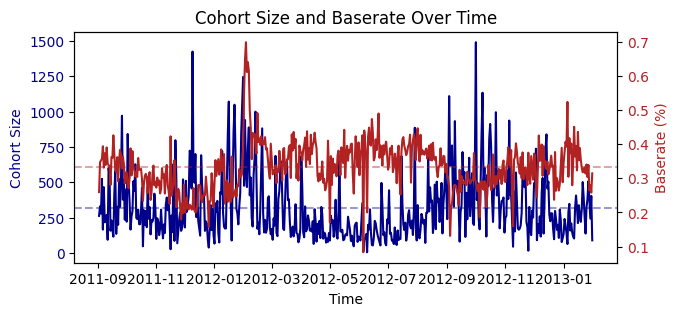

In [7]:
cohort_summary = summarize_cohorts(db_engine, experiment_hashes[0], generate_plots=True)

In [8]:
cohort_summary

,label_name,label_timespan,as_of_date,cohort_size,baserate
0,quickstart_label,120 days,2011-09-02,262,0.2595
1,quickstart_label,120 days,2011-09-03,329,0.3465
2,quickstart_label,120 days,2011-09-04,278,0.3525
3,quickstart_label,120 days,2011-09-05,524,0.3569
4,quickstart_label,120 days,2011-09-06,165,0.3939
5,quickstart_label,120 days,2011-09-07,465,0.3312
6,quickstart_label,120 days,2011-09-08,217,0.3733
7,quickstart_label,120 days,2011-09-09,221,0.3394
8,quickstart_label,120 days,2011-09-10,269,0.3903
9,quickstart_label,120 days,2011-09-11,93,0.3441


In [9]:
cohort_summary[['cohort_size', 'baserate']].describe()

,cohort_size,baserate
count,518.0000,518.0000
mean,318.8668,0.3327
std,228.7667,0.0699
min,5.0000,0.0833
25%,156.0000,0.2874
50%,249.5000,0.3320
75%,423.7500,0.3766
max,1490.0000,0.6989


## 4. Predictors 

In [10]:
features = list_all_features(db_engine, experiment_hashes[0])
features

,feature_group,feature_name,metrics,time_horizons,feature_type,imputation
0,donation_features,district_funding_rate_1yr,sum,all,continuous_aggregate,"{""all"": {""type"": ""constant"", ""value"": 0}}"
1,donation_features,zip_avg_donations_1yr,sum,all,continuous_aggregate,"{""all"": {""type"": ""constant"", ""value"": 0}}"
2,donation_features,zip_funding_rate_1yr,sum,all,continuous_aggregate,"{""all"": {""type"": ""constant"", ""value"": 0}}"
3,donation_features,teacher_avg_donations_2yr,sum,all,continuous_aggregate,"{""all"": {""type"": ""constant"", ""value"": 0}}"
4,donation_features,teacher_funding_rate_2yr,sum,all,continuous_aggregate,"{""all"": {""type"": ""constant"", ""value"": 0}}"
5,donation_features,teacher_avg_donations_1yr,sum,all,continuous_aggregate,"{""all"": {""type"": ""constant"", ""value"": 0}}"
6,donation_features,teacher_funding_rate_1yr,sum,all,continuous_aggregate,"{""all"": {""type"": ""constant"", ""value"": 0}}"
7,donation_features,district_avg_donations_2yr,sum,all,continuous_aggregate,"{""all"": {""type"": ""constant"", ""value"": 0}}"
8,donation_features,district_funding_rate_2yr,sum,all,continuous_aggregate,"{""all"": {""type"": ""constant"", ""value"": 0}}"
9,donation_features,district_avg_donations_1yr,sum,all,continuous_aggregate,"{""all"": {""type"": ""constant"", ""value"": 0}}"


### 4.1 Missingness of Features 

In [11]:
feature_missingness_stats(db_engine)

2024-09-05 16:30:16 -    INFO 5 Tables


,mean (%),min (%),max (%)
resources_features_entity_id_all_item_quantity,1.3722,0.0,27.3973
resources_features_entity_id_all_item_unit_price,1.3722,0.0,27.3973
donation_features_entity_id_all_district_avg_donations_1yr,31.6839,0.0,53.8947
donation_features_entity_id_all_district_avg_donations_2yr,20.8356,0.0,36.1702
donation_features_entity_id_all_district_funding_rate_1yr,28.9151,0.0,48.6316
donation_features_entity_id_all_district_funding_rate_2yr,18.4579,0.0,36.1702
donation_features_entity_id_all_teacher_avg_donations_1yr,62.4781,0.0,91.9355
donation_features_entity_id_all_teacher_avg_donations_2yr,53.8363,0.0,89.0681
donation_features_entity_id_all_teacher_funding_rate_1yr,60.5686,0.0,90.5018
donation_features_entity_id_all_teacher_funding_rate_2yr,52.1607,0.0,88.1720


## 5. Model Groups Built

In [12]:
summarize_model_groups(db_engine, experiment_hashes)

,model_group_id,model_type,hyperparameters
0,813,sklearn.dummy.DummyClassifier,{'strategy': 'prior'}
1,591,sklearn.ensemble.RandomForestClassifier,"{'max_depth': 2, 'max_features': 'sqrt', 'n_estimators': 1000, 'min_samples_split': 2}"
2,592,sklearn.ensemble.RandomForestClassifier,"{'max_depth': 2, 'max_features': 'sqrt', 'n_estimators': 2500, 'min_samples_split': 2}"
3,593,sklearn.ensemble.RandomForestClassifier,"{'max_depth': 2, 'max_features': 'sqrt', 'n_estimators': 5000, 'min_samples_split': 2}"
4,594,sklearn.ensemble.RandomForestClassifier,"{'max_depth': 2, 'max_features': 'sqrt', 'n_estimators': 10000, 'min_samples_split': 2}"
5,595,sklearn.ensemble.RandomForestClassifier,"{'max_depth': 2, 'max_features': 'sqrt', 'n_estimators': 1000, 'min_samples_split': 10}"
6,596,sklearn.ensemble.RandomForestClassifier,"{'max_depth': 2, 'max_features': 'sqrt', 'n_estimators': 2500, 'min_samples_split': 10}"
7,597,sklearn.ensemble.RandomForestClassifier,"{'max_depth': 2, 'max_features': 'sqrt', 'n_estimators': 5000, 'min_samples_split': 10}"
8,598,sklearn.ensemble.RandomForestClassifier,"{'max_depth': 2, 'max_features': 'sqrt', 'n_estimators': 10000, 'min_samples_split': 10}"
9,599,sklearn.ensemble.RandomForestClassifier,"{'max_depth': 2, 'max_features': 'sqrt', 'n_estimators': 1000, 'min_samples_split': 25}"


## 6. All Models Built

In [13]:
list_all_models(db_engine, experiment_hashes)

,model_id,model_group_id,model_type,hyperparameters,train_end_time
0,7071,813,sklearn.dummy.DummyClassifier,{'strategy': 'prior'},2012-09-01
1,7134,813,sklearn.dummy.DummyClassifier,{'strategy': 'prior'},2012-11-01
2,6945,813,sklearn.dummy.DummyClassifier,{'strategy': 'prior'},2012-05-01
3,7039,813,sklearn.dummy.DummyClassifier,{'strategy': 'prior'},2012-08-01
4,6913,813,sklearn.dummy.DummyClassifier,{'strategy': 'prior'},2012-04-01
5,7007,813,sklearn.dummy.DummyClassifier,{'strategy': 'prior'},2012-07-01
6,7167,813,sklearn.dummy.DummyClassifier,{'strategy': 'prior'},2012-12-01
7,6849,813,sklearn.dummy.DummyClassifier,{'strategy': 'prior'},2012-02-01
8,7103,813,sklearn.dummy.DummyClassifier,{'strategy': 'prior'},2012-10-01
9,7199,813,sklearn.dummy.DummyClassifier,{'strategy': 'prior'},2013-01-01


## 7. Model Performance

### 7(a) Overall Cohort

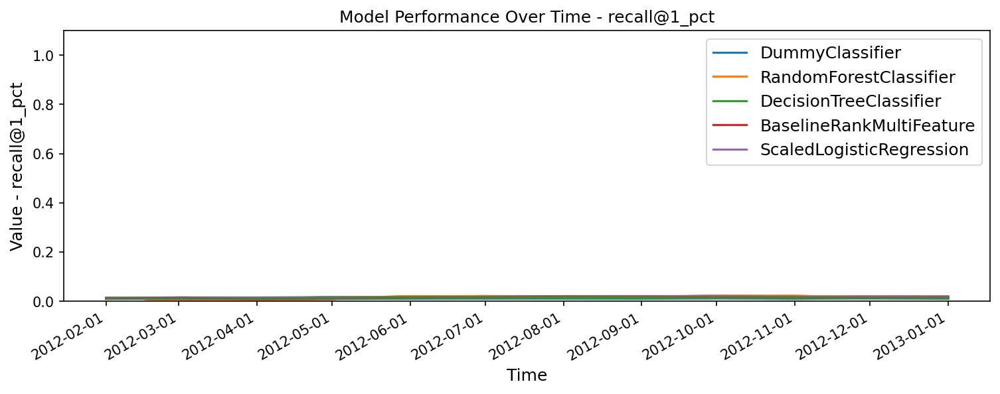

<Figure size 768x576 with 0 Axes>

In [14]:
plot_performance_all_models(db_engine, experiment_hashes, performance_metric, threshold)

### 7(b) Cohort subsets

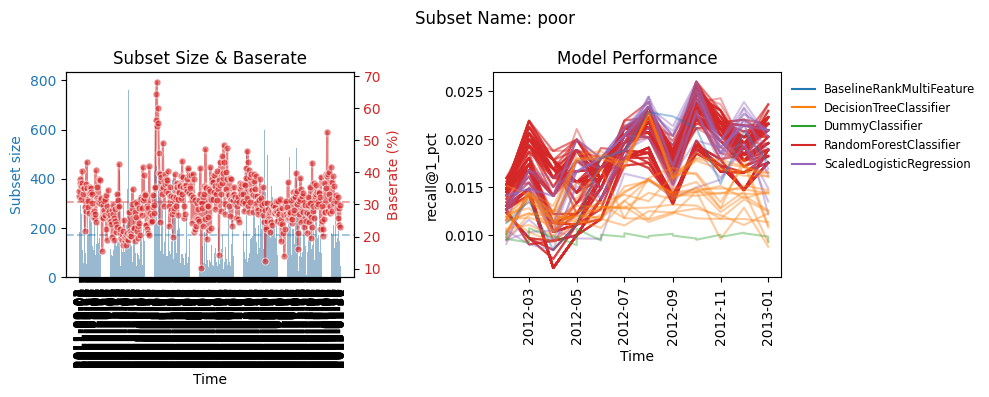

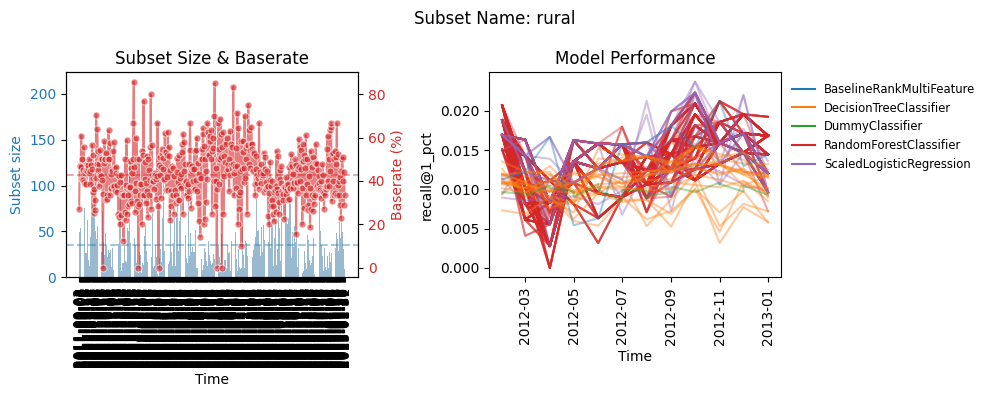

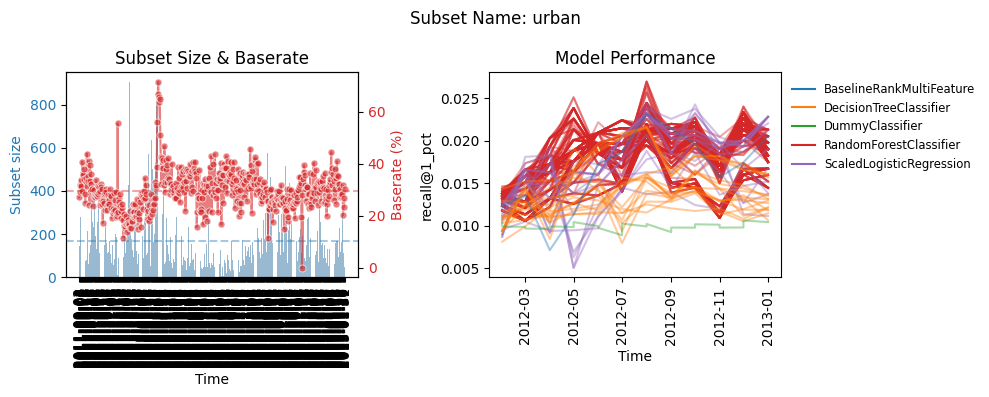

In [15]:
plot_subset_performance(db_engine, experiment_hashes, threshold, performance_metric)

## 8. Model Performance vs Bias

2024-09-05 16:30:51 - WARNING No model groups specified. Usign all model group ids


2024-09-05 16:30:51 -    INFO No groups are specified. Showing results for all attributes and their values


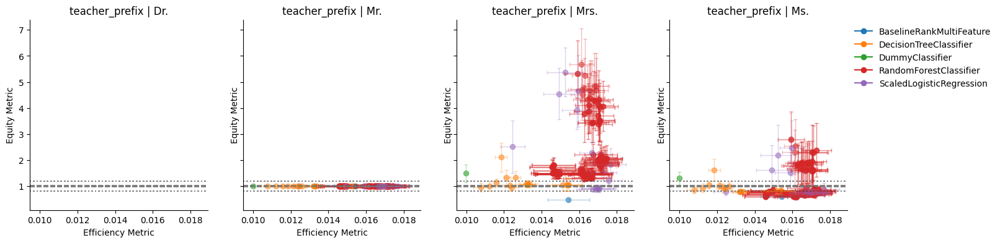

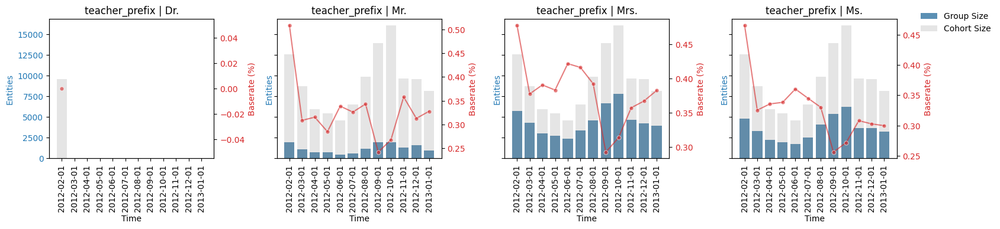

In [16]:
plot_performance_against_bias(
    engine=db_engine,
    experiment_hashes=experiment_hashes,
    metric=performance_metric,
    parameter=threshold,
    bias_metric=bias_metric,
    groups=None # This attribute need to be updated for 
)

## 9. Precision-Recall Graphs

In [17]:
# plot_prk_curves(db_engine, experiment_hashes, step_size=0.01)

## 10. Initial Model Selection and Further analysis on best models
For the purposes of this report, by default, we pick the best performing model from each model type based on average performance to generate additional outputs about the developed models. We would not assume the existence of predictions at this stage. Therefore, we will not do analysis such as list comparisons, crosstabs, score distribution type stuff. we'll look at more higher level comparisons between the different model types

In [18]:
best_models = get_best_hp_config_for_each_model_type(db_engine, experiment_hashes, performance_metric, threshold)
best_models

,model_type,hyperparameters,mean_performance
model_group_id,,,
787,ScaledLogisticRegression,"{'C': 0.1, 'solver': 'saga', 'penalty': 'l1', 'max_iter': 10000}",0.0177
717,RandomForestClassifier,"{'max_depth': 10, 'max_features': 'auto', 'n_estimators': 5000, 'min_samples_split': 50}",0.0175
803,DecisionTreeClassifier,"{'max_depth': 5, 'random_state': 0, 'min_samples_split': 25}",0.0154
814,BaselineRankMultiFeature,"{'rules': [{'feature': 'project_features_entity_id_all_total_asking_price_sum', 'low_value_high_score': False}]}",0.0154


In [19]:
try: 
    rep = PostmodelingReport(
        engine=db_engine,
        experiment_hashes=experiment_hashes,
        model_groups=best_models.index.tolist()
    )
except Exception as e:
    rep = None
    logging.error('No best models')

### 10.1 Feature Importance

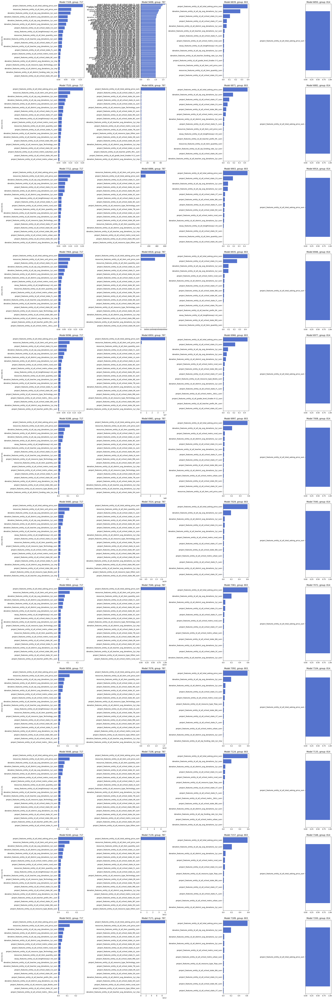

In [20]:
if rep:
    rep.plot_feature_importance()

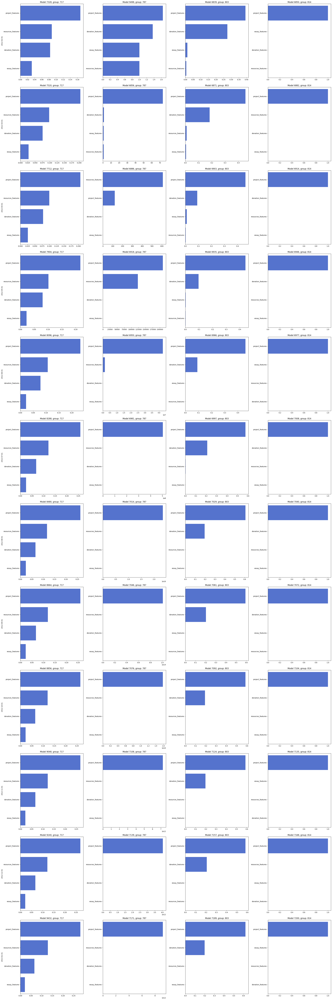

In [21]:
if rep: 
    rep.plot_feature_group_importance(n_top_groups=20)

### 10.2 Recall Curves

2024-09-05 16:31:52 - WARNING No predictions were found in test_results.predictions for model_id 8664. Returning empty dataframe!


2024-09-05 16:31:52 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:52 - WARNING 
                            No predictions were found for model id 8664 (group: 717) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:52 - WARNING No predictions were found in test_results.predictions for model_id 7046. Returning empty dataframe!


2024-09-05 16:31:52 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:52 - WARNING 
                            No predictions were found for model id 7046 (group: 787) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:52 - WARNING No predictions were found in test_results.predictions for model_id 7061. Returning empty dataframe!


2024-09-05 16:31:52 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:52 - WARNING 
                            No predictions were found for model id 7061 (group: 803) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:52 - WARNING No predictions were found in test_results.predictions for model_id 7072. Returning empty dataframe!


2024-09-05 16:31:52 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:52 - WARNING 
                            No predictions were found for model id 7072 (group: 814) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:52 - WARNING No predictions were found in test_results.predictions for model_id 8856. Returning empty dataframe!


2024-09-05 16:31:52 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:52 - WARNING 
                            No predictions were found for model id 8856 (group: 717) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:53 - WARNING No predictions were found in test_results.predictions for model_id 7076. Returning empty dataframe!


2024-09-05 16:31:53 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:53 - WARNING 
                            No predictions were found for model id 7076 (group: 787) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:53 - WARNING No predictions were found in test_results.predictions for model_id 7092. Returning empty dataframe!


2024-09-05 16:31:53 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:53 - WARNING 
                            No predictions were found for model id 7092 (group: 803) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:53 - WARNING No predictions were found in test_results.predictions for model_id 7104. Returning empty dataframe!


2024-09-05 16:31:53 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:53 - WARNING 
                            No predictions were found for model id 7104 (group: 814) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:53 - WARNING No predictions were found in test_results.predictions for model_id 9048. Returning empty dataframe!


2024-09-05 16:31:53 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:53 - WARNING 
                            No predictions were found for model id 9048 (group: 717) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:53 - WARNING No predictions were found in test_results.predictions for model_id 7108. Returning empty dataframe!


2024-09-05 16:31:53 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:53 - WARNING 
                            No predictions were found for model id 7108 (group: 787) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:53 - WARNING No predictions were found in test_results.predictions for model_id 7124. Returning empty dataframe!


2024-09-05 16:31:53 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:53 - WARNING 
                            No predictions were found for model id 7124 (group: 803) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:53 - WARNING No predictions were found in test_results.predictions for model_id 7135. Returning empty dataframe!


2024-09-05 16:31:53 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:53 - WARNING 
                            No predictions were found for model id 7135 (group: 814) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:53 - WARNING No predictions were found in test_results.predictions for model_id 9240. Returning empty dataframe!


2024-09-05 16:31:53 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:53 - WARNING 
                            No predictions were found for model id 9240 (group: 717) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:53 - WARNING No predictions were found in test_results.predictions for model_id 7139. Returning empty dataframe!


2024-09-05 16:31:53 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:53 - WARNING 
                            No predictions were found for model id 7139 (group: 787) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:53 - WARNING No predictions were found in test_results.predictions for model_id 7157. Returning empty dataframe!


2024-09-05 16:31:53 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:53 - WARNING 
                            No predictions were found for model id 7157 (group: 803) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:53 - WARNING No predictions were found in test_results.predictions for model_id 7168. Returning empty dataframe!


2024-09-05 16:31:53 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:53 - WARNING 
                            No predictions were found for model id 7168 (group: 814) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:53 - WARNING No predictions were found in test_results.predictions for model_id 9432. Returning empty dataframe!


2024-09-05 16:31:53 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:53 - WARNING 
                            No predictions were found for model id 9432 (group: 717) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:53 - WARNING No predictions were found in test_results.predictions for model_id 7171. Returning empty dataframe!


2024-09-05 16:31:53 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:53 - WARNING 
                            No predictions were found for model id 7171 (group: 787) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:53 - WARNING No predictions were found in test_results.predictions for model_id 7189. Returning empty dataframe!


2024-09-05 16:31:53 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:53 - WARNING 
                            No predictions were found for model id 7189 (group: 803) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


2024-09-05 16:31:53 - WARNING No predictions were found in test_results.predictions for model_id 7200. Returning empty dataframe!


2024-09-05 16:31:53 -  NOTICE No labels present, skipping predictions sorting .


2024-09-05 16:31:53 - WARNING 
                            No predictions were found for model id 7200 (group: 814) 
                            or a subset_hash was provided. Using the evaluations to generate the plot. Zoomed PR-K not supported!


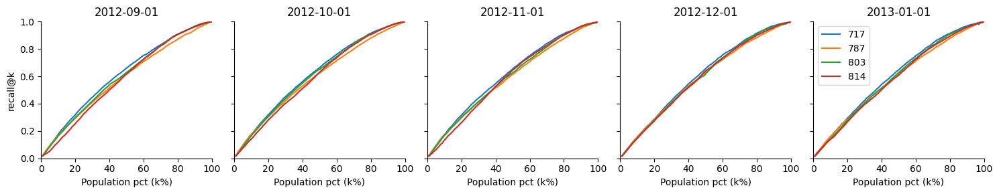

In [22]:
if rep:
    rep.plot_recall_curves_overlaid(n_splits=5)